In [1]:
import matplotlib.pyplot as plt
import torch
import importlib
from sklearn import datasets, manifold
import LMPL
from LMPL import LMPL_org, train_org
import torch.optim as optim
import numpy as np
from torch.optim.lr_scheduler import ReduceLROnPlateau

from sklearn.datasets import make_swiss_roll

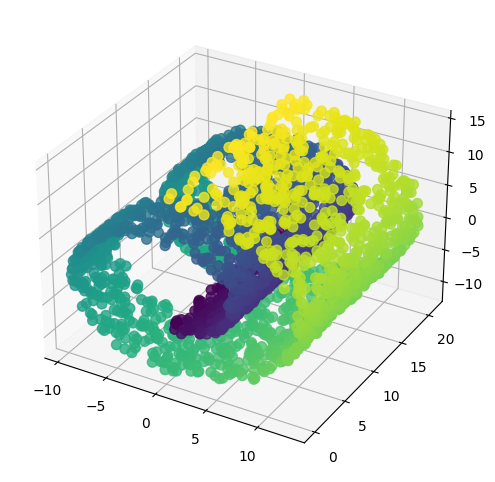

In [2]:
X, y = make_swiss_roll(n_samples=3000, hole=True,noise=0.1)

x_train = torch.from_numpy(X).float()

fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(X[:, 0], X[:, 1], X[:, 2], c=y, s=50, alpha=0.8)
plt.show()

In [3]:

def train_model(alpha,epsilon, X, input_dim=3, output_dim=2, epochs=400, learning_rate=0.005, hidden_layers=[10,20]):
    model = LMPL_org(input_dim, output_dim, alpha, epsilon=epsilon,hidden_layers=hidden_layers)
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    y_train = train_org(model, optimizer, X, epochs, alpha)
    return y_train

def plot_results(y_train, title):
    y_train_np = y_train.detach().numpy()
    fig, ax = plt.subplots(figsize=(8, 8))
    scatter = ax.scatter(y_train_np[:, 0], y_train_np[:, 1], c=y, s=50, alpha=0.8)
    plt.title(title)
    plt.show()
    
def scan_dis_all(dis_values,epsilon_over_dis, X, lr, epochs, hidden_layers):
    num_alphas = len(dis_values)
    cols = 3
    rows = (num_alphas + cols - 1) // cols  
    fig, axs = plt.subplots(rows, cols, figsize=(15, 5 * rows))  
    axs = axs.flatten()  
    
    for i, distance in enumerate(dis_values):
        print(f"Training with distance={distance}")
        epsilon=distance*epsilon_over_dis
        alpha=1/(distance+epsilon)
        y_train = train_model(alpha, epsilon,X, learning_rate=lr, epochs=epochs, hidden_layers=hidden_layers)  
        y_train_np = y_train.detach().numpy()  
        
        if y_train_np.shape[0] == y_part.shape[0]:
            scatter = axs[i].scatter(y_train_np[:, 0], y_train_np[:, 1], c=y, s=15, alpha=0.8)
        else:
            print("Warning: y_train_np and y_part shapes do not match!")
        scatter = axs[i].scatter(y_train_np[:, 0], y_train_np[:, 1], c=y, s=15, alpha=0.8)  
        axs[i].set_title(f'Alpha={alpha} Hidden_layers={hidden_layers}')  
    
    plt.tight_layout()  
    plt.show() 
    
    return 

def scan_dis_epsilon_all(dis_values,epsilon_over_dis, X, lr, epochs, hidden_layers):
    num_distances = len(dis_values)
    num_epsilons = len(epsilon_over_dis)
    total_plots = num_distances * num_epsilons
    cols = 3 
    rows = (total_plots + cols - 1) // cols  
    fig, axs = plt.subplots(rows, cols, figsize=(15, 5 * rows))  
    axs = axs.flatten()  
    
    plot_idx = 0
    for distance in dis_values:
        
        for ratio in epsilon_over_dis:
            epsilon = distance * ratio
            alpha = 1 / (distance + epsilon)
            print(f"Training with distance={distance}, epsilon={ratio},hiddenlayer={hidden_layers}")
            
            y_train = train_model(alpha, epsilon, X, learning_rate=lr, epochs=epochs, hidden_layers=hidden_layers)
            y_train_np = y_train.detach().numpy()
            
            if y_train_np.shape[0] == y.shape[0]: 
                scatter = axs[plot_idx].scatter(y_train_np[:, 0], y_train_np[:, 1], c=y, s=15, alpha=0.8)
            else:
                print("Warning: y_train_np and y_part shapes do not match!")
            
            axs[plot_idx].set_title(f'gamma={distance} epsilon={ratio}\nHidden_layers={hidden_layers}')
            plot_idx += 1

    
    plt.tight_layout()  
    plt.show() 
    
    return



Training with distance=2, epsilon=0.1,hiddenlayer=[256, 128]
Epoch [1/1000], Loss: 0.0111
Epoch [50/1000], Loss: 0.0043
Epoch [100/1000], Loss: 0.0042
Epoch [150/1000], Loss: 0.0043
Epoch [200/1000], Loss: 0.0043
Epoch [250/1000], Loss: 0.0043
Epoch [300/1000], Loss: 0.0043
Epoch [350/1000], Loss: 0.0043
Epoch [400/1000], Loss: 0.0043
Epoch [450/1000], Loss: 0.0043
Epoch [500/1000], Loss: 0.0043
Epoch [550/1000], Loss: 0.0043
Epoch [600/1000], Loss: 0.0043
Epoch [650/1000], Loss: 0.0043
Epoch [700/1000], Loss: 0.0043
Epoch [750/1000], Loss: 0.0043
Epoch [800/1000], Loss: 0.0043
Epoch [850/1000], Loss: 0.0043
Epoch [900/1000], Loss: 0.0043
Epoch [950/1000], Loss: 0.0043
Epoch [1000/1000], Loss: 0.0043
Training with distance=3, epsilon=0.1,hiddenlayer=[256, 128]
Epoch [1/1000], Loss: 0.0086
Epoch [50/1000], Loss: 0.0033
Epoch [100/1000], Loss: 0.0033
Epoch [150/1000], Loss: 0.0032
Epoch [200/1000], Loss: 0.0033
Epoch [250/1000], Loss: 0.0031
Epoch [300/1000], Loss: 0.0029
Epoch [350/1000

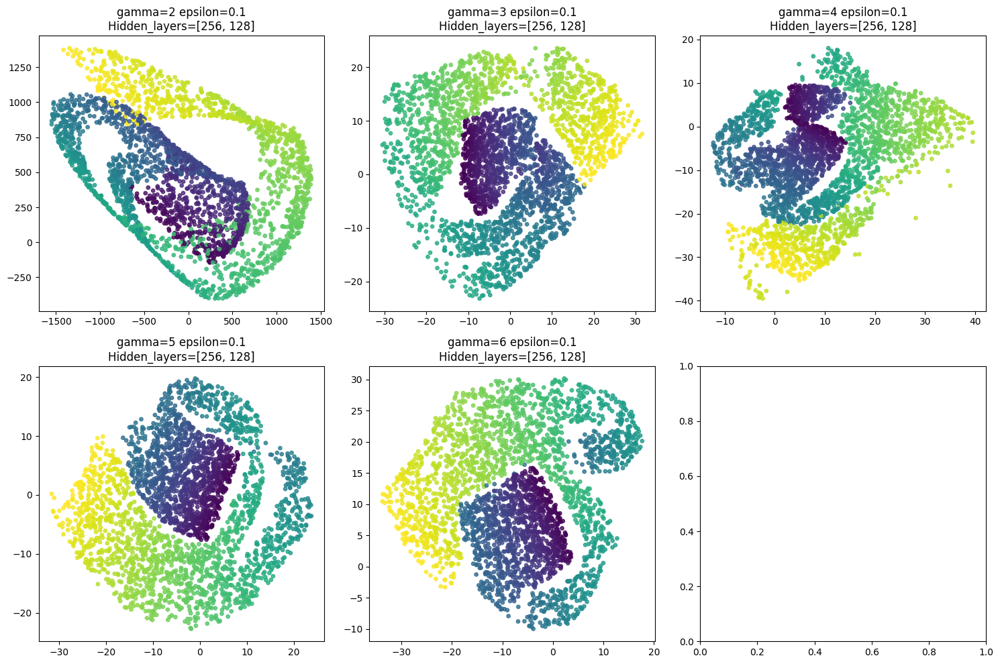

In [4]:
dis=[2,3,4,5,6]
hiddenlayers=[256,128]
epsilons=[0.1]
lr=0.01
scan_dis_epsilon_all(dis,epsilons,x_train,lr,epochs=1000,hidden_layers=hiddenlayers)

Training with distance=1, epsilon=0.1,hiddenlayer=[68, 32]
Epoch [1/500], Loss: 0.0430
Epoch [50/500], Loss: 0.0098
Epoch [100/500], Loss: 0.0098
Epoch [150/500], Loss: 0.0099
Epoch [200/500], Loss: 0.0098
Epoch [250/500], Loss: 0.0098
Epoch [300/500], Loss: 0.0098
Epoch [350/500], Loss: 0.0099
Epoch [400/500], Loss: 0.0099
Epoch [450/500], Loss: 0.0099
Epoch [500/500], Loss: 0.0099
Training with distance=1, epsilon=0.01,hiddenlayer=[68, 32]
Epoch [1/500], Loss: 0.0401
Epoch [50/500], Loss: 0.0159
Epoch [100/500], Loss: 0.0146
Epoch [150/500], Loss: 0.0170
Epoch [200/500], Loss: 0.0139
Epoch [250/500], Loss: 0.0137
Epoch [300/500], Loss: 0.0137
Epoch [350/500], Loss: 0.0137
Epoch [400/500], Loss: 0.0137
Epoch [450/500], Loss: 0.0137
Epoch [500/500], Loss: 0.0137
Training with distance=1, epsilon=0.001,hiddenlayer=[68, 32]
Epoch [1/500], Loss: 0.5586
Epoch [50/500], Loss: 0.6842
Epoch [100/500], Loss: 0.4604
Epoch [150/500], Loss: 0.4602
Epoch [200/500], Loss: 0.2374
Epoch [250/500], Lo

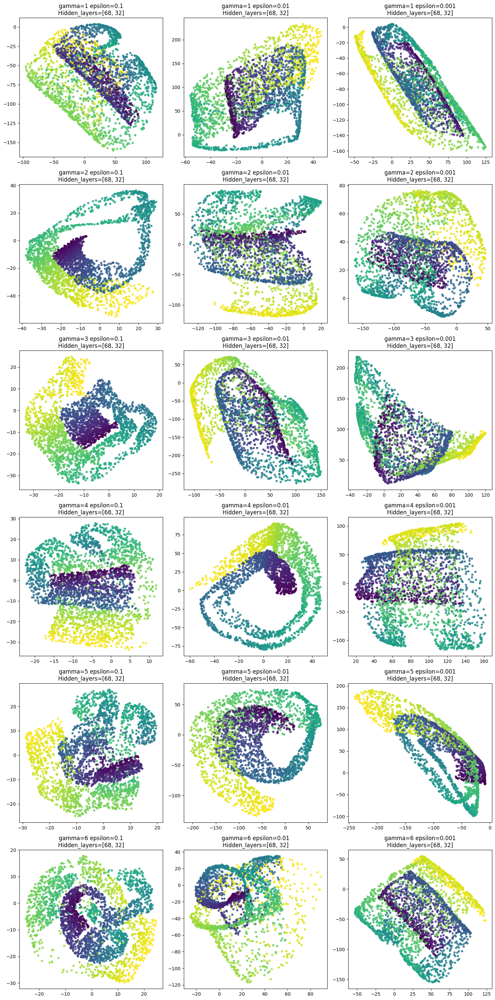

In [5]:
dis=[1,2,3,4,5,6]
hiddenlayers=[68,32]
epsilons=[0.1,0.01,0.001]
lr=0.01
scan_dis_epsilon_all(dis,epsilons,x_train,lr,epochs=500,hidden_layers=hiddenlayers)

Training with distance=1, epsilon=0.1,hiddenlayer=[128, 64]
Epoch [1/500], Loss: 0.0240
Epoch [50/500], Loss: 0.0100
Epoch [100/500], Loss: 0.0100
Epoch [150/500], Loss: 0.0100
Epoch [200/500], Loss: 0.0100
Epoch [250/500], Loss: 0.0100
Epoch [300/500], Loss: 0.0100
Epoch [350/500], Loss: 0.0100
Epoch [400/500], Loss: 0.0100
Epoch [450/500], Loss: 0.0100
Epoch [500/500], Loss: 0.0100
Training with distance=1, epsilon=0.2,hiddenlayer=[128, 64]
Epoch [1/500], Loss: 0.0162
Epoch [50/500], Loss: 0.0078
Epoch [100/500], Loss: 0.0078
Epoch [150/500], Loss: 0.0078
Epoch [200/500], Loss: 0.0078
Epoch [250/500], Loss: 0.0078
Epoch [300/500], Loss: 0.0078
Epoch [350/500], Loss: 0.0078
Epoch [400/500], Loss: 0.0078
Epoch [450/500], Loss: 0.0078
Epoch [500/500], Loss: 0.0078
Training with distance=1, epsilon=0.3,hiddenlayer=[128, 64]
Epoch [1/500], Loss: 0.0082
Epoch [50/500], Loss: 0.0065
Epoch [100/500], Loss: 0.0065
Epoch [150/500], Loss: 0.0065
Epoch [200/500], Loss: 0.0065
Epoch [250/500], Lo

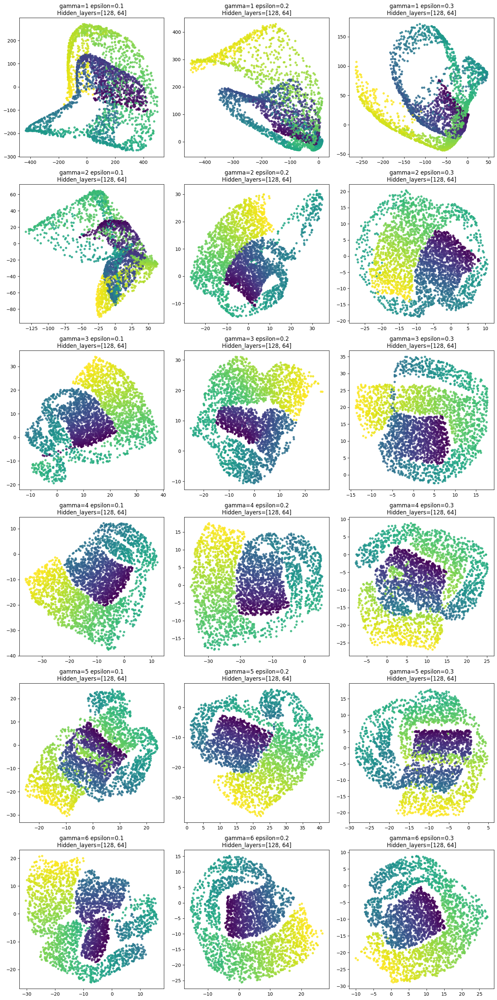

In [6]:
dis=[1,2,3,4,5,6]
hiddenlayers=[128,64]
epsilons=[0.1,0.2,0.3]
lr=0.01
scan_dis_epsilon_all(dis,epsilons,x_train,lr,epochs=500,hidden_layers=hiddenlayers)

Training with distance=1, epsilon=0.1,hiddenlayer=[128, 64]
Epoch [1/800], Loss: 0.0185
Epoch [50/800], Loss: 0.0100
Epoch [100/800], Loss: 0.0098
Epoch [150/800], Loss: 0.0099
Epoch [200/800], Loss: 0.0100
Epoch [250/800], Loss: 0.0098
Epoch [300/800], Loss: 0.0098
Epoch [350/800], Loss: 0.0096
Epoch [400/800], Loss: 0.0095
Epoch [450/800], Loss: 0.0095
Epoch [500/800], Loss: 0.0095
Epoch [550/800], Loss: 0.0095
Epoch [600/800], Loss: 0.0094
Epoch [650/800], Loss: 0.0094
Epoch [700/800], Loss: 0.0094
Epoch [750/800], Loss: 0.0094
Epoch [800/800], Loss: 0.0094
Training with distance=1, epsilon=0.2,hiddenlayer=[128, 64]
Epoch [1/800], Loss: 0.0189
Epoch [50/800], Loss: 0.0076
Epoch [100/800], Loss: 0.0076
Epoch [150/800], Loss: 0.0075
Epoch [200/800], Loss: 0.0075
Epoch [250/800], Loss: 0.0075
Epoch [300/800], Loss: 0.0075
Epoch [350/800], Loss: 0.0075
Epoch [400/800], Loss: 0.0075
Epoch [450/800], Loss: 0.0077
Epoch [500/800], Loss: 0.0075
Epoch [550/800], Loss: 0.0075
Epoch [600/800],

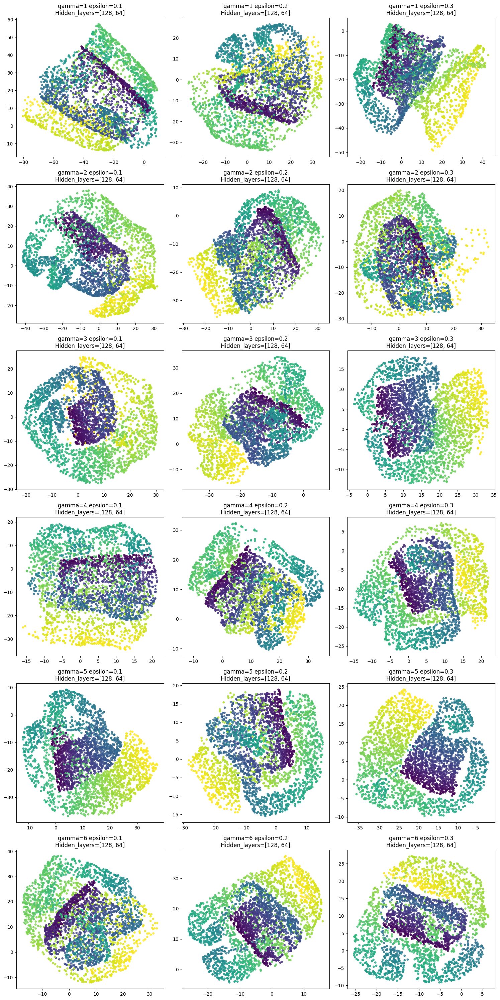

In [8]:
dis=[1,2,3,4,5,6]
hiddenlayers=[128,64]
epsilons=[0.1,0.2,0.3]
lr=0.001
scan_dis_epsilon_all(dis,epsilons,x_train,lr,epochs=800,hidden_layers=hiddenlayers)

Training with distance=1, epsilon=0.1,hiddenlayer=[256, 512]
Epoch [1/600], Loss: 0.0211
Epoch [50/600], Loss: 0.0100
Epoch [100/600], Loss: 0.0100
Epoch [150/600], Loss: 0.0100
Epoch [200/600], Loss: 0.0100
Epoch [250/600], Loss: 0.0100
Epoch [300/600], Loss: 0.0100
Epoch [350/600], Loss: 0.0100
Epoch [400/600], Loss: 0.0100
Epoch [450/600], Loss: 0.0100
Epoch [500/600], Loss: 0.0100
Epoch [550/600], Loss: 0.0100
Epoch [600/600], Loss: 0.0100
Training with distance=2, epsilon=0.1,hiddenlayer=[256, 512]
Epoch [1/600], Loss: 0.0143
Epoch [50/600], Loss: 0.0043
Epoch [100/600], Loss: 0.0043
Epoch [150/600], Loss: 0.0042
Epoch [200/600], Loss: 0.0043
Epoch [250/600], Loss: 0.0043
Epoch [300/600], Loss: 0.0043
Epoch [350/600], Loss: 0.0043
Epoch [400/600], Loss: 0.0043
Epoch [450/600], Loss: 0.0043
Epoch [500/600], Loss: 0.0043
Epoch [550/600], Loss: 0.0043
Epoch [600/600], Loss: 0.0043
Training with distance=3, epsilon=0.1,hiddenlayer=[256, 512]
Epoch [1/600], Loss: 0.0063
Epoch [50/600],

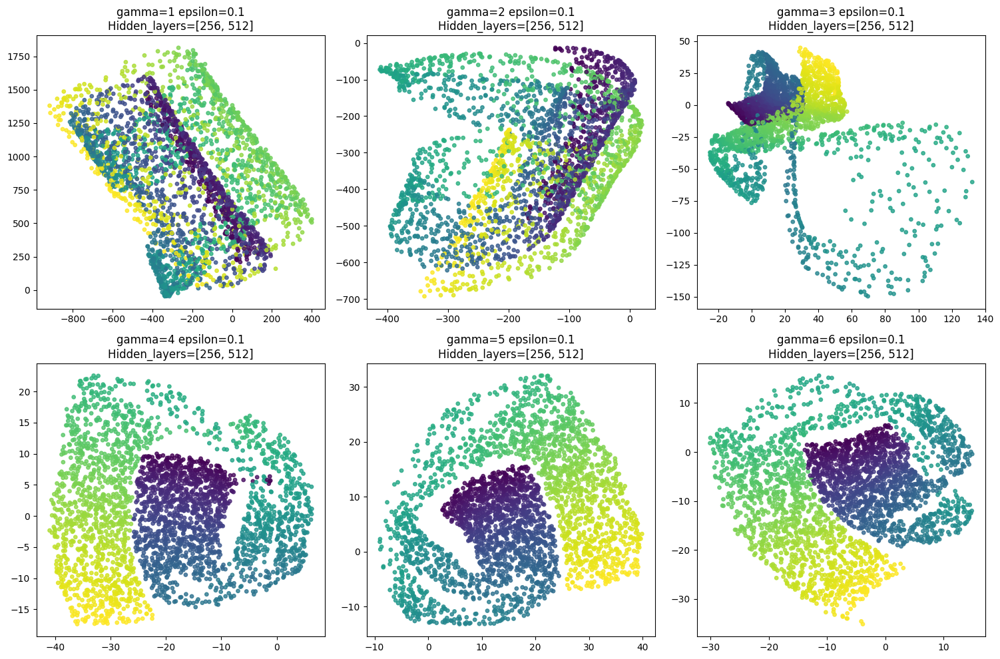

In [9]:
dis=[1,2,3,4,5,6]
hiddenlayers=[256,512]
epsilons=[0.1]
lr=0.005
scan_dis_epsilon_all(dis,epsilons,x_train,lr,epochs=600,hidden_layers=hiddenlayers)